<a id="99"></a>
# Python 7 Assignment
### Purpose: To Create and Evaluate a Decision Tree
<b>Program Sections</b>
<ul>
<li><a href = "#0">Import Python Packages</a></li>
<li><a href = "#1">Set Display</a></li>
<li><a href = "#2">Load the Data and Evaluate Fields</a></li>
<li><a href = "#3">Data Cleansing and Feature Engineering</a></li>  
<li><a href = "#4">Save the Dataframe as a CSV File</a></li>    
<li><a href = "#5">Determine Baseline Accuracy</a></li>    
<li><a href = "#6">Create Training (Validation) and Testing Datasets</a></li>
<li><a href = "#7">Create and Evaluate a Simple 2-level Decision Tree</a></li>
<li><a href = "#8">Create your best Decision Tree</a></li>
<li><a href = "#9">Use Grid Search to find the Best Hyperparameters and Decision Tree</a></li>
<li><a href = "#10">Assignment Submission</a></li></ul>

<a id="0"></a>
### Import Python Packages
<a href = "#99">Top</a>

In [1]:
# Cell Block 0
import numpy as np 
import pandas as pd 
import seaborn as sns
import graphviz
import pydot
import os

from IPython.display import Image

from matplotlib import pyplot as plt
from matplotlib import style

from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RepeatedKFold

<a id="1"></a>
### Set Display
<a href = "#99">Top</a>

In [2]:
# Cell Block 1
# Set display to show up to 100 columns in dataframe
pd.set_option('display.max_columns',100) 

# Set plot style
plt.style.use('seaborn')

<a id="2"></a>
### Load the Data and Evaluate Fields
<a href = "#99">Top</a>

In [3]:
# Cell Block 2
# Read CSV file into dataframe
df_cellco = pd.read_csv("Cellco Churn Data.csv",encoding="latin1")

### Here is a description of what is in each field
<ul>
<li><b>Customer ID:</b> Unique customer ID</li>
<li><b>Gender:</b> Whether the customer is a male or a female</li>
<li><b>Senior Citizen:</b> Whether the customer is a senior citizen or not</li>
<li><b>Spouse/Partner:</b> Whether the customer has a partner or not</li>
<li><b>Dependents:</b> Whether the customer has dependents or not</li>
<li><b>Tenure:</b> Number of months the customer has stayed with the company</li>
<li><b>Phone Service:</b> Whether the customer has a phone service or not</li>
<li><b>Multiple Lines:</b> Whether the customer has multiple lines or not</li>
<li><b>Internet Service:</b> Customer’s internet service type</li>
<li><b>Online Security:</b> Whether the customer has online security or not</li>
<li><b>Online Backup:</b> Whether the customer has online backup or not</li>
<li><b>Device Protection:</b> Whether the customer has device protection or not</li>
<li><b>Tech Support:</b> Whether the customer has tech support or not</li>
<li><b>Streaming TV:</b> Whether the customer has streaming TV or not</li>
<li><b>Streaming Movies:</b> Whether the customer has streaming movies or not</li>
<li><b>Contract:</b> The contract term of the customer</li>
<li><b>Paperless Billing:</b> Whether the customer has paperless billing or not</li>
<li><b>Payment Method:</b> The customer’s payment method</li>
<li><b>Monthly Charges:</b> The amount charged to the customer monthly</li>
<li><b>Lifetime Charges:</b> The total amount charged to the customer over their tenure</li>
<li><b>Retained:</b> Whether or not the customer is currently utilizing company services</li></ul>

In [4]:
# Cell Block 3
# What fields and data are available in the dataframe?
df_cellco.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Customer ID        7043 non-null   object 
 1   Gender             7043 non-null   object 
 2   Senior Citizen     7043 non-null   object 
 3   Spouse/Partner     7043 non-null   object 
 4   Dependents         7043 non-null   object 
 5   Tenure             7043 non-null   int64  
 6   Phone Service      7043 non-null   object 
 7   Multiple Lines     6361 non-null   object 
 8   Internet Service   7043 non-null   object 
 9   Online Security    7043 non-null   object 
 10  Online Backup      7043 non-null   object 
 11  Device Protection  7043 non-null   object 
 12  Tech Support       7043 non-null   object 
 13  Streaming TV       7043 non-null   object 
 14  Streaming Movies   7043 non-null   object 
 15  Contract           7043 non-null   object 
 16  Paperless Billing  7043 

In [5]:
# Cell Block 4
# What does the actual data look like?
df_cellco.sample(10)

,Customer ID,Gender,Senior Citizen,Spouse/Partner,Dependents,Tenure,Phone Service,Multiple Lines,Internet Service,Online Security,Online Backup,Device Protection,Tech Support,Streaming TV,Streaming Movies,Contract,Paperless Billing,Payment Method,Monthly Charges,Lifetime Charges,Retained
493,0723-FDLAY,Male,No,No,No,44,Yes,Yes,DSL,No,Yes,Yes,Yes,Yes,Yes,One year,Yes,Bank transfer (automatic),85.25,3704.15,Yes
5169,7271-AJDTL,Female,No,Yes,No,55,Yes,Yes,Fiber optic,No,Yes,Yes,No,Yes,No,Month-to-month,Yes,Credit card (automatic),94.45,5073.1,Yes
3567,5055-MGMGF,Female,No,Yes,No,65,Yes,Yes,Fiber optic,Yes,No,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,105.05,6914.95,Yes
6873,9764-REAFF,Female,No,Yes,No,59,Yes,No,No,No Internet Service,No Internet Service,No Internet Service,No Internet Service,No Internet Service,No Internet Service,Two year,No,Bank transfer (automatic),18.40,1057.85,Yes
2338,3347-YJZZE,Male,No,Yes,Yes,29,Yes,Yes,DSL,No,Yes,Yes,No,Yes,Yes,Month-to-month,No,Credit card (automatic),80.10,2211.8,Yes
5737,8071-SBTRN,Female,No,No,No,70,Yes,Yes,Fiber optic,Yes,Yes,Yes,No,Yes,Yes,Two year,Yes,Mailed check,111.15,7737.55,Yes
343,0508-SQWPL,Female,No,Yes,Yes,57,Yes,No,No,No Internet Service,No Internet Service,No Internet Service,No Internet Service,No Internet Service,No Internet Service,Two year,Yes,Bank transfer (automatic),20.10,1087.7,Yes
4302,6061-PQHMK,Female,No,No,No,25,Yes,No,No,No Internet Service,No Internet Service,No Internet Service,No Internet Service,No Internet Service,No Internet Service,One year,No,Credit card (automatic),19.90,527.5,Yes
5699,8033-ATFAS,Female,No,Yes,Yes,39,Yes,No,DSL,No,No,Yes,No,Yes,No,Month-to-month,Yes,Mailed check,59.85,2341.5,Yes
1816,2651-ZCBXV,Male,No,No,No,54,Yes,Yes,Fiber optic,Yes,Yes,No,Yes,Yes,Yes,Two year,Yes,Credit card (automatic),108.00,5760.65,Yes


In [6]:
# Cell Block 5
# Get a list of column names
df_cellco.columns

Index(['Customer ID', 'Gender', 'Senior Citizen', 'Spouse/Partner',
       'Dependents', 'Tenure', 'Phone Service', 'Multiple Lines',
       'Internet Service', 'Online Security', 'Online Backup',
       'Device Protection', 'Tech Support', 'Streaming TV', 'Streaming Movies',
       'Contract', 'Paperless Billing', 'Payment Method', 'Monthly Charges',
       'Lifetime Charges', 'Retained'],
      dtype='object')

<a id="3"></a>
### Data Cleansing and Feature Engineering
<a href = "#99">Top</a>

##### Evaluate and Clean Quantitative Fields

In [7]:
# Cell Block 6
# Looking for typical values and outliers
df_cellco.describe()

,Tenure,Monthly Charges
count,7043.000000,7043.000000
mean,32.371149,64.761692
std,24.559481,30.090047
min,0.000000,18.250000
25%,9.000000,35.500000
50%,29.000000,70.350000
75%,55.000000,89.850000
max,72.000000,118.750000


In [8]:
# Cell Block 7
# Evaluate numeric variable for reason it is listed as an object data type
df_cellco['Lifetime Charges'].value_counts()

# Note blank values that are not listed as missing values

20.2       11
           11
19.75       9
19.65       8
19.9        8
           ..
5175.3      1
7624.2      1
1614.7      1
6741.15     1
2142.8      1
Name: Lifetime Charges, Length: 6531, dtype: int64

In [9]:
# Cell Block 8
# Replace blanks spaces with zeroes
df_cellco['Lifetime Charges'].replace(' ', 0, inplace=True)

# Convert field data type from object to numeric
df_cellco['Lifetime Charges'] = pd.to_numeric(df_cellco['Lifetime Charges'])

# Evaluate variable for values that are unusual
df_cellco['Lifetime Charges'].describe()

count    7043.000000
mean     2279.734304
std      2266.794470
min         0.000000
25%       398.550000
50%      1394.550000
75%      3786.600000
max      8684.800000
Name: Lifetime Charges, dtype: float64

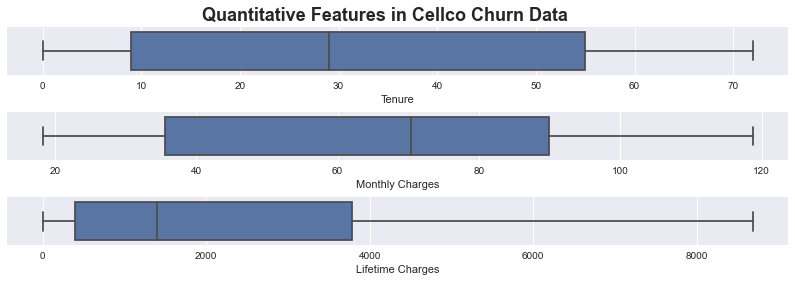

In [10]:
# Cell Block 9
# Look at the quantitative fields to see if there are any outliers

# Create boxplots of quantitative feature distributions
plt.figure(figsize=(14,4))
plt.subplots_adjust(hspace=0.8)

# Set overall title for plot
plt.suptitle('Quantitative Features in Cellco Churn Data', fontweight='bold', 
          fontsize='18', horizontalalignment='center', y=.95)

plt.subplot(311)
ax2 = sns.boxplot(x='Tenure', data=df_cellco)

plt.subplot(312)
ax3 = sns.boxplot(x='Monthly Charges', data=df_cellco)

plt.subplot(313)
ax4 = sns.boxplot(x='Lifetime Charges', data=df_cellco)

plt.show()

##### Evaluate, Clean, and Code Qualitative Fields

In [11]:
# Cell Block 10
# Look at missing values in feature variable
df_cellco.groupby('Phone Service')['Multiple Lines'].value_counts(dropna=False)

Phone Service  Multiple Lines
No             NaN                682
Yes            No                3390
               Yes               2971
Name: Multiple Lines, dtype: int64

In [12]:
# Cell Block 11
# Fill missing values by adding a new level in feature
df_cellco['Multiple Lines'] = df_cellco['Multiple Lines'].fillna('No Phone Service')

In [13]:
# Cell Block 12
# Look at levels in feature variable
df_cellco['Gender'].value_counts()

Male      3555
Female    3488
Name: Gender, dtype: int64

In [14]:
# Cell Block 13
# Replace qualitative data with binary numbers for a single dummy variable
df_cellco['Gender'].replace(to_replace=dict(Male=1, Female=0), inplace=True)

In [15]:
# Cell Block 14
# Look at levels in feature variable
df_cellco['Senior Citizen'].value_counts()

No     5901
Yes    1142
Name: Senior Citizen, dtype: int64

In [16]:
# Cell Block 15
# Replace qualitative data with binary numbers for a single dummy variable
df_cellco['Senior Citizen'].replace(to_replace=dict(Yes=1, No=0), inplace=True)

In [17]:
# Cell Block 16
# Look at levels in feature variable
df_cellco['Spouse/Partner'].value_counts()

No     3641
Yes    3402
Name: Spouse/Partner, dtype: int64

In [18]:
# Cell Block 17
# Replace qualitative data with binary numbers for a single dummy variable
df_cellco['Spouse/Partner'].replace(to_replace=dict(Yes=1, No=0), inplace=True)

In [19]:
# Cell Block 18
# Look at levels in feature variable
df_cellco['Dependents'].value_counts()

No     4933
Yes    2110
Name: Dependents, dtype: int64

In [20]:
# Cell Block 19
# Replace qualitative data with binary numbers for a single dummy variable
df_cellco['Dependents'].replace(to_replace=dict(Yes=1, No=0), inplace=True)

In [21]:
# Cell Block 20
# Look at levels in feature variable
df_cellco['Phone Service'].value_counts()

Yes    6361
No      682
Name: Phone Service, dtype: int64

In [22]:
# Cell Block 21
# Replace qualitative data with binary numbers for a single dummy variable
df_cellco['Phone Service'].replace(to_replace=dict(Yes=1, No=0), inplace=True)

In [23]:
# Cell Block 22
# Look at levels in feature variable
df_cellco['Multiple Lines'].value_counts()

No                  3390
Yes                 2971
No Phone Service     682
Name: Multiple Lines, dtype: int64

In [24]:
# Cell Block 23
# Create one-hot encoding variables for all levels
onehot_multLines = pd.get_dummies(df_cellco['Multiple Lines'], prefix='multLines',
                                  prefix_sep="=", drop_first=False, dtype='int')

In [25]:
# Cell Block 24
# Look at levels in feature variable
df_cellco['Internet Service'].value_counts()

Fiber optic    3096
DSL            2421
No             1526
Name: Internet Service, dtype: int64

In [26]:
# Cell Block 25
# Create one-hot encoding variables for all levels
onehot_internetServ = pd.get_dummies(df_cellco['Internet Service'], prefix='internetServ',
                                     prefix_sep="=", drop_first=False, dtype='int')

In [27]:
# Cell Block 26
# Look at levels in feature variable
df_cellco['Online Security'].value_counts()

No                     3498
Yes                    2019
No Internet Service    1526
Name: Online Security, dtype: int64

In [28]:
# Cell Block 27
# Create one-hot encoding variables for all levels
onehot_onlSecurity = pd.get_dummies(df_cellco['Online Security'], prefix='onlSecurity',
                                    prefix_sep="=", drop_first=False, dtype='int')

In [29]:
# Cell Block 28
# Look at levels in feature variable
df_cellco['Online Backup'].value_counts()

No                     3088
Yes                    2429
No Internet Service    1526
Name: Online Backup, dtype: int64

In [30]:
# Cell Block 29
# Create one-hot encoding variables for all levels
onehot_onlBackup = pd.get_dummies(df_cellco['Online Backup'], prefix='onlBackup',
                                  prefix_sep="=", drop_first=False, dtype='int')

In [31]:
# Cell Block 30
# Look at levels in feature variable
df_cellco['Device Protection'].value_counts()

No                     3095
Yes                    2422
No Internet Service    1526
Name: Device Protection, dtype: int64

In [32]:
# Cell Block 31
# Create one-hot encoding variables for all levels
onehot_devProtect = pd.get_dummies(df_cellco['Device Protection'], prefix='devProtect',
                                   prefix_sep="=", drop_first=False, dtype='int')

In [33]:
# Cell Block 32
# Look at levels in feature variable
df_cellco['Tech Support'].value_counts()

No                     3473
Yes                    2044
No Internet Service    1526
Name: Tech Support, dtype: int64

In [34]:
# Cell Block 33
# Create one-hot encoding variables for all levels
onehot_techSupport = pd.get_dummies(df_cellco['Tech Support'], prefix='techSupport',
                                  prefix_sep="=", drop_first=False, dtype='int')

In [35]:
# Cell Block 34
# Look at levels in feature variable
df_cellco['Streaming TV'].value_counts()

No                     2810
Yes                    2707
No Internet Service    1526
Name: Streaming TV, dtype: int64

In [36]:
# Cell Block 35
# Create one-hot encoding variables for all levels
onehot_streamTV = pd.get_dummies(df_cellco['Streaming TV'], prefix='streamTV',
                                  prefix_sep="=", drop_first=False, dtype='int')

In [37]:
# Cell Block 36
# Look at levels in feature variable
df_cellco['Streaming Movies'].value_counts()

No                     2785
Yes                    2732
No Internet Service    1526
Name: Streaming Movies, dtype: int64

In [38]:
# Cell Block 37
# Create one-hot encoding variables for all levels
onehot_streamMovies = pd.get_dummies(df_cellco['Streaming Movies'], prefix='streamMovies',
                                  prefix_sep="=", drop_first=False, dtype='int')

In [39]:
# Cell Block 38
# Look at levels in feature variable
df_cellco['Contract'].value_counts()

Month-to-month     3126
Two year           1695
One year           1473
Month-to-month      749
Name: Contract, dtype: int64

In [40]:
# Cell Block 39
# Remove trailing spaces from entries
df_cellco['Contract'] = df_cellco['Contract'].str.rstrip()

In [41]:
# Cell Block 40
# Check levels in feature variable
df_cellco['Contract'].value_counts()

Month-to-month    3875
Two year          1695
One year          1473
Name: Contract, dtype: int64

In [42]:
# Cell Block 41
# Create one-hot encoding variables for all levels
onehot_contract = pd.get_dummies(df_cellco['Contract'], prefix='contract',
                                  prefix_sep="=", drop_first=False, dtype='int')

In [43]:
# Cell Block 42
# Look at levels in feature variable
df_cellco['Paperless Billing'].value_counts()

Yes    4171
No     2872
Name: Paperless Billing, dtype: int64

In [44]:
# Cell Block 43
# Create one-hot encoding variables for all levels
onehot_paperless = pd.get_dummies(df_cellco['Paperless Billing'], prefix='paperless',
                                  prefix_sep="=", drop_first=False, dtype='int')

In [45]:
# Cell Block 44
# Look at levels in feature variable
df_cellco['Payment Method'].value_counts()

Electronic check               2365
Mailed check                   1612
Credit card (automatic)        1494
Bank transfer (automatic)      1464
Bank transfer  (automatic)       80
Credit Card (automatic)          28
Name: Payment Method, dtype: int64

In [46]:
# Cell Block 45
# Correct mistyped entries
df_cellco = df_cellco.replace({'Credit Card (automatic)':'Credit card (automatic)',
                               'Bank transfer  (automatic)':'Bank transfer (automatic)'})

In [47]:
# Cell Block 46
# Check levels in feature variable
df_cellco['Payment Method'].value_counts()

Electronic check               2365
Mailed check                   1612
Credit card (automatic)        1522
Bank transfer (automatic)      1464
Bank transfer  (automatic)       80
Name: Payment Method, dtype: int64

In [48]:
# Cell Block 47
# Remove trailing spaces from entries
df_cellco['Payment Method'] = df_cellco['Payment Method'].str.rstrip()

In [49]:
# Cell Block 48
# Correct mistyped entries
df_cellco = df_cellco.replace('Bank transfer  (automatic)', 'Bank transfer (automatic)')

In [50]:
# Cell Block 49
# Check levels in feature variable
df_cellco['Payment Method'].value_counts()

Electronic check             2365
Mailed check                 1612
Bank transfer (automatic)    1544
Credit card (automatic)      1522
Name: Payment Method, dtype: int64

In [51]:
# Cell Block 50
# Create one-hot encoding variables for all levels
onehot_payment = pd.get_dummies(df_cellco['Payment Method'], prefix='payment',
                                  prefix_sep="=", drop_first=False, dtype='int')

In [52]:
# Cell Block 51
# Check levels in feature variable
df_cellco['Retained'].value_counts()

Yes    5174
No     1869
Name: Retained, dtype: int64

In [53]:
# Cell Block 52
# Create binary coded dummy variable for churn
df_cellco['Retained'].replace(to_replace=dict(Yes=1, No=0), inplace=True)

In [54]:
# Cell Block 53
# Concatenate the one-hot encoded variables to the existing dataframe
df_cellco = pd.concat([df_cellco, onehot_multLines, onehot_internetServ, onehot_onlSecurity,
                       onehot_onlBackup, onehot_devProtect, onehot_techSupport,
                       onehot_streamTV, onehot_streamMovies, onehot_contract, 
                       onehot_paperless, onehot_payment], axis = 1)

In [55]:
# Cell Block 54
#  Get current column names
df_cellco.columns.values

array(['Customer ID', 'Gender', 'Senior Citizen', 'Spouse/Partner',
       'Dependents', 'Tenure', 'Phone Service', 'Multiple Lines',
       'Internet Service', 'Online Security', 'Online Backup',
       'Device Protection', 'Tech Support', 'Streaming TV',
       'Streaming Movies', 'Contract', 'Paperless Billing',
       'Payment Method', 'Monthly Charges', 'Lifetime Charges',
       'Retained', 'multLines=No', 'multLines=No Phone Service',
       'multLines=Yes', 'internetServ=DSL', 'internetServ=Fiber optic',
       'internetServ=No', 'onlSecurity=No',
       'onlSecurity=No Internet Service', 'onlSecurity=Yes',
       'onlBackup=No', 'onlBackup=No Internet Service', 'onlBackup=Yes',
       'devProtect=No', 'devProtect=No Internet Service',
       'devProtect=Yes', 'techSupport=No',
       'techSupport=No Internet Service', 'techSupport=Yes',
       'streamTV=No', 'streamTV=No Internet Service', 'streamTV=Yes',
       'streamMovies=No', 'streamMovies=No Internet Service',
       'st

In [56]:
# Cell Block 55
# Correct elongated names on one-hot encoded fields
df_cellco = df_cellco.rename(columns = {'payment=Bank transfer (automatic)': 'payment=Bank Transfer',
                                        'payment=Credit card (automatic)'  : 'payment=Credit Card'})

In [57]:
# Cell Block 56
# Evaluate data for modeling in Decision Tree
df_cellco.sample(10)

,Customer ID,Gender,Senior Citizen,Spouse/Partner,Dependents,Tenure,Phone Service,Multiple Lines,Internet Service,Online Security,Online Backup,Device Protection,Tech Support,Streaming TV,Streaming Movies,Contract,Paperless Billing,Payment Method,Monthly Charges,Lifetime Charges,Retained,multLines=No,multLines=No Phone Service,multLines=Yes,internetServ=DSL,internetServ=Fiber optic,internetServ=No,onlSecurity=No,onlSecurity=No Internet Service,onlSecurity=Yes,onlBackup=No,onlBackup=No Internet Service,onlBackup=Yes,devProtect=No,devProtect=No Internet Service,devProtect=Yes,techSupport=No,techSupport=No Internet Service,techSupport=Yes,streamTV=No,streamTV=No Internet Service,streamTV=Yes,streamMovies=No,streamMovies=No Internet Service,streamMovies=Yes,contract=Month-to-month,contract=One year,contract=Two year,paperless=No,paperless=Yes,payment=Bank Transfer,payment=Credit Card,payment=Electronic check,payment=Mailed check
1886,2737-YNGYW,0,0,0,0,2,1,No,Fiber optic,No,No,No,No,No,Yes,Month-to-month,No,Electronic check,80.55,184.10,0,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,1,0,0,1,0,0,0,1,0
413,0613-WUXUM,0,0,1,1,70,1,No,No,No Internet Service,No Internet Service,No Internet Service,No Internet Service,No Internet Service,No Internet Service,Two year,Yes,Mailed check,19.20,1401.40,1,1,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,1
5901,8309-PPCED,0,0,1,0,72,1,Yes,Fiber optic,No,Yes,Yes,Yes,Yes,Yes,Two year,Yes,Bank transfer (automatic),110.45,7982.50,1,0,0,1,0,1,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,1,1,0,0,0
5143,7240-FQLHE,0,1,1,0,18,1,Yes,Fiber optic,No,No,No,Yes,Yes,Yes,Month-to-month,No,Bank transfer (automatic),99.75,1836.25,0,0,0,1,0,1,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,1,1,0,0,1,0,1,0,0,0
660,0967-BMLBD,0,0,1,1,11,1,No,No,No Internet Service,No Internet Service,No Internet Service,No Internet Service,No Internet Service,No Internet Service,One year,Yes,Mailed check,20.00,196.35,1,1,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1
3492,4947-DSMXK,1,0,1,1,34,1,Yes,Fiber optic,No,Yes,No,No,Yes,Yes,Month-to-month,Yes,Bank transfer (automatic),97.70,3410.00,1,0,0,1,0,1,0,1,0,0,0,0,1,1,0,0,1,0,0,0,0,1,0,0,1,1,0,0,0,1,1,0,0,0
6117,8661-BOYNW,0,0,1,0,72,1,Yes,DSL,Yes,No,Yes,Yes,Yes,Yes,Two year,Yes,Credit card (automatic),84.40,6096.45,1,0,0,1,1,0,0,0,0,1,1,0,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,1,0,1,0,0
3649,5158-RIVOP,0,0,1,1,11,1,No,No,No Internet Service,No Internet Service,No Internet Service,No Internet Service,No Internet Service,No Internet Service,Two year,No,Credit card (automatic),20.90,202.30,1,1,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,1,0,0,1,0,0
5108,7180-PISOG,1,0,1,1,1,1,Yes,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,74.50,74.50,0,0,0,1,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0
3212,4608-LCIMN,1,0,1,1,8,1,No,DSL,No,No,No,No,No,No,Month-to-month,No,Bank transfer (automatic),44.65,369.15,1,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,1,0,0,0


<a id="4"></a>
### Save the Dataframe as a CSV File
<a href = "#99">Top</a>

In [58]:
# Cell Block 57
# Save the dataframe as a CSV file for the next assignment
# This way you will not have to re-clean the data before analyzing it
df_cellco.to_csv('Cellco Churn Data - Cleaned.csv', index=False)

<a id="5"></a>
### Determine Baseline Accuracy
<a href = "#99">Top</a>

In [59]:
# Cell Block 58
# Baseline accuracy is if we predicted all individuals would remain and not churn
# We have to beat this as a minimum
df_cellco['Retained'].value_counts(normalize=True).mul(100).round(1).astype(str) + '%'

1    73.5%
0    26.5%
Name: Retained, dtype: object

<a id="6"></a>
### Create Training (Validation) and Testing  Datasets
<a href = "#99">Top</a>

In [60]:
# Cell Block 59
# Create a list of features to be utilized
X_names = ['Gender', 'Senior Citizen', 'Spouse/Partner', 'Dependents', 'Tenure', 
           'Phone Service', 'Monthly Charges', 'Lifetime Charges', 'multLines=No',
           'multLines=No Phone Service', 'multLines=Yes', 'internetServ=DSL',
           'internetServ=Fiber optic', 'internetServ=No', 'onlSecurity=No',
           'onlSecurity=No Internet Service', 'onlSecurity=Yes', 'onlBackup=No', 
           'onlBackup=No Internet Service', 'onlBackup=Yes', 'devProtect=No', 
           'devProtect=No Internet Service', 'devProtect=Yes', 'techSupport=No',
           'techSupport=No Internet Service', 'techSupport=Yes', 'streamTV=No',
           'streamTV=No Internet Service', 'streamTV=Yes', 'streamMovies=No',
           'streamMovies=No Internet Service', 'streamMovies=Yes', 'contract=Month-to-month',
           'contract=One year', 'contract=Two year', 'paperless=No', 'paperless=Yes',
           'payment=Bank Transfer', 'payment=Credit Card', 'payment=Electronic check',
           'payment=Mailed check']

# Create X matrix of features
X = df_cellco[X_names].copy()

# Create y vector of retained results
y = df_cellco[['Retained']].copy()

In [61]:
# Cell Block 60
# Split the data into 80% training and 20% testing data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state=42)

<a id="7"></a>
### Create and Evaluate a Simple 2-level Decision Tree
<a href = "#99">Top</a>

In [62]:
# Cell Block 61
# Create a basic 2-level decision tree based on the training data
decision_tree = DecisionTreeClassifier(max_depth=2, random_state=42)
dt_simple = decision_tree.fit(X_train, y_train)  

In [63]:
# Cell Block 62
# Draw decision tree graphically
export_graphviz(dt_simple, out_file='tree_simple.dot',
                feature_names=X_names, class_names=['Churned', 'Retained'],
                special_characters=True, rounded=True, proportion=False, precision=3, filled=True)

In [64]:
# Cell Block 63
# Output graphical decision tree to file
!dot -Tpng tree_simple.dot -o tree_simple.png -Gdpi=300

# Remove extra file
os.remove('tree_simple.dot')

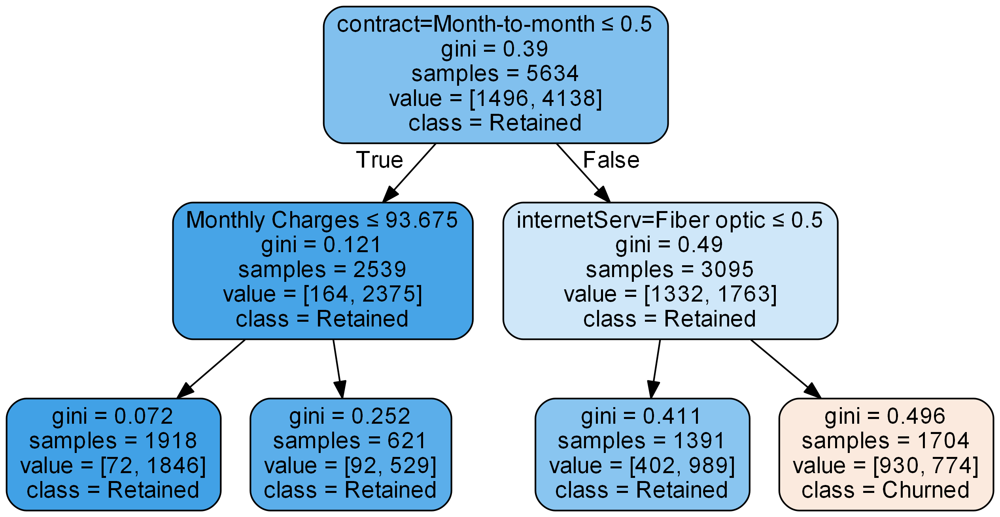

In [65]:
# Cell Block 64
# Show decision tree image and results on training data
Image(filename='tree_simple.png')

In [66]:
# Cell Block 65
# Predict using decision tree on test data
y_pred = dt_simple.predict(X_test) 

# Create a confusion matrix showing the predicted and true results
cm = confusion_matrix(y_test, y_pred)

# Show confusion matrix in raw form
cm

array([[232, 141],
       [192, 844]], dtype=int64)

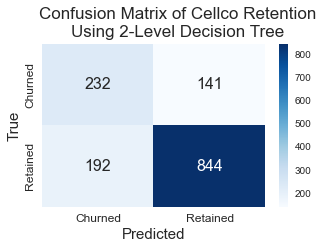

In [67]:
# Cell Block 66
# Create a heat map showing the results of the confusion matrix
fig, axes = plt.subplots(nrows=1, ncols=1, sharex = True, figsize=(5, 3))
fig.suptitle('Confusion Matrix of Cellco Retention\nUsing 2-Level Decision Tree', 
             fontsize=17, y = 1.05)
ax = plt.subplot()
sns.heatmap(cm, annot=True, cmap="Blues", annot_kws={"size": 16}, ax = ax, fmt = "g")
ax.set_xlabel('Predicted', fontsize=15)
ax.set_ylabel('True', fontsize=15)
ax.xaxis.set_ticklabels(['Churned', 'Retained'], fontsize=12)
ax.yaxis.set_ticklabels(['Churned', 'Retained'], fontsize=12, va ='center')
plt.show()

In [68]:
# Cell Block 67
# show statistics on decision tree performance
print("Results from 2-Level Decision Tree")
print("Accuracy: "+"{:.2%}".format(accuracy_score(y_test, y_pred)))
print("Report: \n", classification_report(y_test, y_pred, 
                                          target_names = ['Churned', 'Retained'], digits = 3)) 

Results from 2-Level Decision Tree
Accuracy: 76.37%
Report: 
               precision    recall  f1-score   support

     Churned      0.547     0.622     0.582       373
    Retained      0.857     0.815     0.835      1036

    accuracy                          0.764      1409
   macro avg      0.702     0.718     0.709      1409
weighted avg      0.775     0.764     0.768      1409



In [69]:
# Cell Block 68
# Create empty copy of dataframe used in model
df_predNew = X_test.head(0).copy()

# Create a prediction probability for the following person:
# Individual is a 45-year-old male. He is married and has two children. He has had phone 
# service with the company for 1 year, with monthly charges of $36 and total charges incurred to 
# date of $453.  He has two phone lines and internet service connection via fiber optics; no 
# additional intenet services have been purchased although he does stream TV and movies. His 
# contract has a single year basis and payments are made via bank transfer. Bills are paperless.
df_predNew.loc[0] = [1, 0, 1, 1, 12, 1, 36, 453, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0]
df_predNew

,Gender,Senior Citizen,Spouse/Partner,Dependents,Tenure,Phone Service,Monthly Charges,Lifetime Charges,multLines=No,multLines=No Phone Service,multLines=Yes,internetServ=DSL,internetServ=Fiber optic,internetServ=No,onlSecurity=No,onlSecurity=No Internet Service,onlSecurity=Yes,onlBackup=No,onlBackup=No Internet Service,onlBackup=Yes,devProtect=No,devProtect=No Internet Service,devProtect=Yes,techSupport=No,techSupport=No Internet Service,techSupport=Yes,streamTV=No,streamTV=No Internet Service,streamTV=Yes,streamMovies=No,streamMovies=No Internet Service,streamMovies=Yes,contract=Month-to-month,contract=One year,contract=Two year,paperless=No,paperless=Yes,payment=Bank Transfer,payment=Credit Card,payment=Electronic check,payment=Mailed check
0,1,0,1,1,12,1,36.0,453.0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,1,1,0,0,0


In [70]:
# Cell Block 69
# Predict probabilty that customer will be retained from created decision tree
newObs_PredProb = dt_simple.predict_proba(df_predNew)[:,1][0]
print("Probabilty that Customer will be Retained: "+"{:.2%}".format(newObs_PredProb))

Probabilty that Customer will be Retained: 96.25%


<a id="8"></a>
### Create your best Decision Tree
<a href = "#99">Top</a>

In [71]:
# Cell Block 70
# Create a decision tree with your settings
decision_tree = DecisionTreeClassifier(max_depth=8, # Suggest values between 3 and 8 
                                       criterion='entropy', # entropy or gini
                                       min_samples_leaf=110, # no less than 10
                                       min_samples_split=420, # no less than 25
                                       random_state=42) # Choose any number as long as it is 42
dt_yours = decision_tree.fit(X_train, y_train) 

In [72]:
# Cell Block 71
# Draw decision tree graphically
export_graphviz(dt_yours, out_file='tree_yours.dot',
                feature_names=X_names, class_names=['Churned', 'Retained'],
                special_characters=True, rounded=True, proportion=False, precision=3, filled=True)

In [73]:
# Cell Block 72
# Output graphical decision tree to file
!dot -Tpng tree_yours.dot -o tree_yours.png -Gdpi=300

# Remove extra file
os.remove('tree_yours.dot')

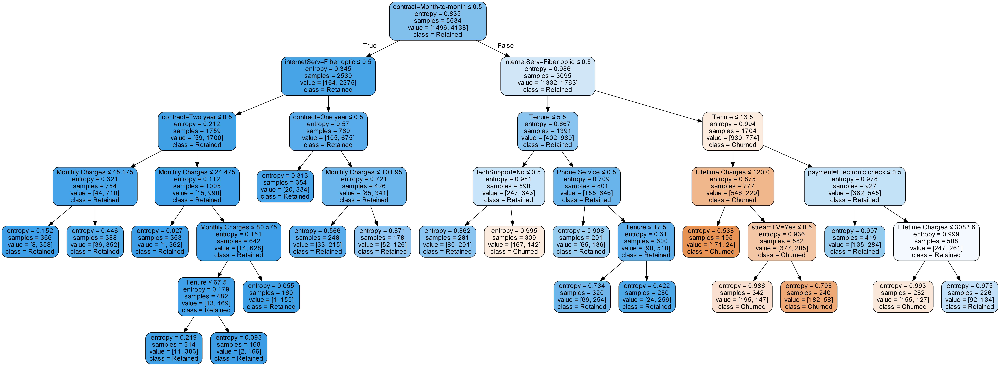

In [74]:
# Cell Block 73
# Show decision tree image and results on training data
Image(filename='tree_yours.png')

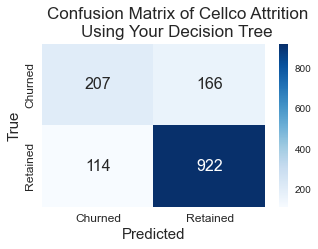

In [75]:
# Cell Block 74
# Predict using decision tree on test data
y_pred = dt_yours.predict(X_test) 

# Create a confusion matrix showing the predicted and true results
cm = confusion_matrix(y_test, y_pred)

# Create a heat map showing the results of the confusion matrix
fig, axes = plt.subplots(nrows=1, ncols=1, sharex = True, figsize=(5, 3))
fig.suptitle('Confusion Matrix of Cellco Attrition\nUsing Your Decision Tree', fontsize=17, y=1.05)
ax = plt.subplot()
sns.heatmap(cm, annot=True, cmap="Blues", annot_kws={"size": 16}, ax=ax, fmt="g")
ax.set_xlabel('Predicted', fontsize=15)
ax.set_ylabel('True', fontsize=15)
ax.xaxis.set_ticklabels(['Churned', 'Retained'], fontsize=12)
ax.yaxis.set_ticklabels(['Churned', 'Retained'], fontsize=12, va='center')
plt.show()

In [76]:
# Cell Block 75
# show statistics on decision tree performance
print("Results from Your Decision Tree")
print("Accuracy: "+"{:.2%}".format(accuracy_score(y_test, y_pred)))
print("Report: \n", classification_report(y_test, y_pred, target_names=['Churned', 'Retained'], 
                                          digits=3)) 

Results from Your Decision Tree
Accuracy: 80.13%
Report: 
               precision    recall  f1-score   support

     Churned      0.645     0.555     0.597       373
    Retained      0.847     0.890     0.868      1036

    accuracy                          0.801      1409
   macro avg      0.746     0.722     0.732      1409
weighted avg      0.794     0.801     0.796      1409



<a id="9"></a>
### Use Grid Search to find the Best Hyperparameters and Decision Tree
<a href = "#99">Top</a>

In [77]:
# Cell Block 76
# Set decision tree parameters to search
weights = {0: .75, 1:.25}
decision_tree = DecisionTreeClassifier(class_weight=weights)
tree_parameters = {'criterion':['gini','entropy'],
                   'max_depth':[3,4,5], 
                   'min_samples_leaf':[10,15,20,25],
                   'min_samples_split':[25,40,60]}

# Define cross validation approach
crossval = RepeatedKFold(n_splits=10, n_repeats=2, random_state=42)

# Run search and validate on training data. Record best hyperparameters
dt_model = GridSearchCV(decision_tree, tree_parameters, cv=crossval)
search_results = dt_model.fit(X_train, y_train)
dt_final = search_results.best_estimator_

In [78]:
# Cell Block 77
# Show "optimal" hyperparameter setting and performance measure
print('Best Decision Tree Hyperparameter Settings from Grid Search')
print('Tree Accuracy: %.3f'   % search_results.best_score_)
print('Best Parameter Settings:\n ', dt_final)

Best Decision Tree Hyperparameter Settings from Grid Search
Tree Accuracy: 0.747
Best Parameter Settings:
  DecisionTreeClassifier(class_weight={0: 0.75, 1: 0.25}, criterion='entropy',
                       max_depth=5, min_samples_leaf=25, min_samples_split=25)


In [79]:
# Cell Block 78
# Draw decision tree graphically
export_graphviz(dt_final, out_file='tree_final.dot',
                feature_names=X_names, class_names=['Churned', 'Retained'],
                special_characters=True, rounded=True, proportion=False, precision=3, filled=True)

In [80]:
# Cell Block 79
# Output graphical decision tree to file
!dot -T png tree_final.dot -o tree_final.png -Gdpi=500

# Remove extra file
os.remove('tree_final.dot')

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.982607 to fit


In [81]:
# Cell Block 80
# Show decision tree image and results on training data
Image(filename='tree_final.png')

In [82]:
# Cell Block 81
# Predict using decision tree on test data
y_pred = dt_final.predict(X_test) 

# Create a confusion matrix showing the predicted and true results
cm = confusion_matrix(y_test, y_pred)

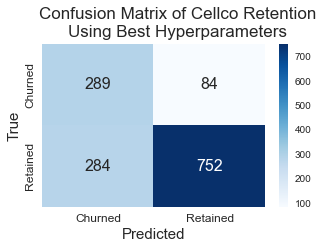

In [83]:
# Cell Block 82
# Create a heat map showing the results of the confusion matrix
fig, axes = plt.subplots(nrows=1, ncols=1, sharex = True, figsize=(5, 3))
fig.suptitle('Confusion Matrix of Cellco Retention\nUsing Best Hyperparameters', 
             fontsize=17, y=1.05)
ax= plt.subplot()
sns.heatmap(cm, annot=True, cmap="Blues", annot_kws={"size": 16}, ax=ax, fmt="g")
ax.set_xlabel('Predicted', fontsize=15)
ax.set_ylabel('True', fontsize=15)
ax.xaxis.set_ticklabels(['Churned', 'Retained'], fontsize=12)
ax.yaxis.set_ticklabels(['Churned', 'Retained'], fontsize=12, va='center')
plt.show()

In [84]:
# Cell Block 83
# show statistics on decision tree performance
print("Results from Decision Tree using Best Hyperparameters")
print("Accuracy: "+"{:.2%}".format(accuracy_score(y_test, y_pred)))
print("Report: \n", classification_report(y_test, y_pred, target_names=['Churned', 'Retained'], 
                                          digits=3)) 

Results from Decision Tree using Best Hyperparameters
Accuracy: 73.88%
Report: 
               precision    recall  f1-score   support

     Churned      0.504     0.775     0.611       373
    Retained      0.900     0.726     0.803      1036

    accuracy                          0.739      1409
   macro avg      0.702     0.750     0.707      1409
weighted avg      0.795     0.739     0.752      1409



<a id="10"></a>
### Assignment Submission
<a href = "#99">Top</a>

## Python Assignment 7
### Name: George Gannon

In [85]:
Image(filename='tree_final.png')

In [86]:
import datetime, socket
print(datetime.datetime.now().isoformat())
print("Your Computer Name is: " + socket.gethostname())
print("Your Computer IP Address is: " + socket.gethostbyname(socket.gethostname()))

2020-11-07T16:11:30.836947
Your Computer Name is: DESKTOP-0VRDGNF
Your Computer IP Address is: 192.168.1.139
